In [2]:
# переключиться на полуточную арифметику (float16)
import tensorflow as tf
from tensorflow.keras.mixed_precision import Policy
policy = Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

In [3]:
# 🔥 САМАЯ БЫСТРАЯ ОЧИСТКА (копируй и запускай)
import tensorflow as tf
import gc
tf.keras.backend.clear_session()
gc.collect()
print("✅ GPU память очищена!")

# 📊 ПРОВЕРИТЬ ПАМЯТЬ
def quick_gpu_check():
    gpus = tf.config.list_physical_devices('GPU')
    print(f"🎯 Активно GPU: {len(gpus)}")
quick_gpu_check()

✅ GPU память очищена!
🎯 Активно GPU: 1


In [ ]:
#!pip install tensorboard

In [3]:
#!pip install scikit-optimize -q

In [4]:
# Оптимизация TensorFlow
import tensorflow as tf
tf.config.optimizer.set_jit(True)  # Включение XLA-компиляции
tf.config.threading.set_intra_op_parallelism_threads(8)
#tf.config.threading.set_inter_op_parallelism_threads(8)

# Для GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
            #tf.config.experimental.set_memory_limit(gpu, 8192)  # Лимит 8GB
    except RuntimeError as e:
        print(e)

In [5]:
!nvidia-smi

Mon Oct 20 14:24:53 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.64.01              Driver Version: 576.80         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070        On  |   00000000:01:00.0 Off |                  N/A |
|  0%   42C    P8             10W /  200W |    1131MiB /  12282MiB |      7%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
import os
HOME = os.getcwd()
print(HOME)

/home/oleg/projects/ML


In [ ]:
'''
import os
import kaggle
import zipfile

# Скачаем напрямую через Kaggle API в текущую папку
dataset_name = 'bhavikjikadara/dog-and-cat-classification-dataset'
download_path = './cats_dogs_data'

print("📥 Downloading dataset...")
kaggle.api.dataset_download_files(
    dataset_name, 
    path=download_path, 
    unzip=True  # Важно: распаковываем автоматически!
)
'''

In [5]:
# Пути
#dataset_path = "/home/oleg/projects/datasets/construction"
#dataset_path = "./animals"
#dataset_path = "./cars_pretrained"
dataset_path = "/home/oleg/projects/datasets/construction"
IMAGE_PATH = dataset_path
directory = dataset_path  # Используем найденный путь
os.listdir(directory)

['mining_loader',
 'bulldozer',
 'ice_rink',
 'dump_truck',
 'excavator',
 'person',
 'car',
 'truck_crane']

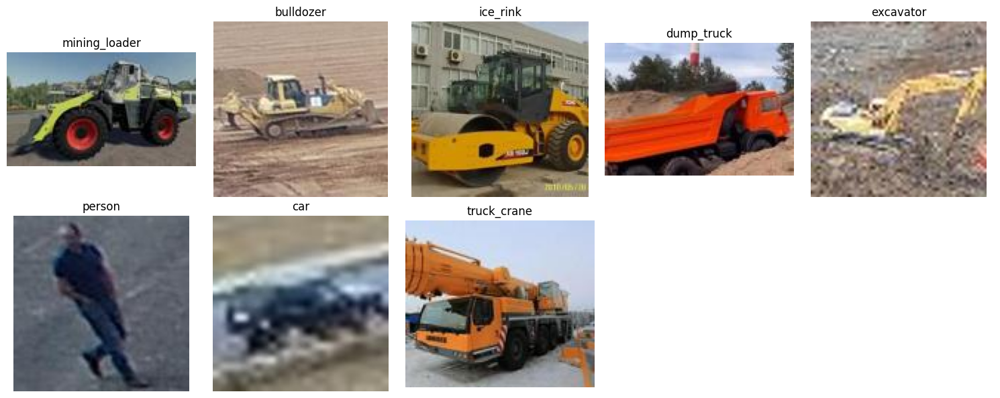

🎲 Показано по 1 случайному изображению из 8 категорий


In [6]:
# Показано по 1 случайному изображению из каждой категорий
from PIL import Image
import os
import matplotlib.pyplot as plt
import random

# Создаем график 2x5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()

categories = os.listdir(IMAGE_PATH)
plot_index = 0

for category in categories:
    category_path = os.path.join(IMAGE_PATH, category)
    file_names = os.listdir(category_path)
    
    # Берем 1 случайное изображение из каждой категории
    if file_names:
        random_file = random.choice(file_names)
        img_path = os.path.join(category_path, random_file)
        img = Image.open(img_path)
        
        axes[plot_index].imshow(img)
        axes[plot_index].set_title(f"{category}", fontsize=12)
        axes[plot_index].axis('off')
        plot_index += 1

# Скрываем лишние subplot'ы
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"🎲 Показано по 1 случайному изображению из {plot_index} категорий")

📊 АНАЛИЗ ДАТАСЕТА:
  bulldozer: 194 файлов
  car: 1586 файлов
  dump_truck: 797 файлов
  excavator: 316 файлов
  ice_rink: 293 файлов
  mining_loader: 514 файлов
  person: 969 файлов
  truck_crane: 321 файлов
📈 ИТОГО: 4990 изображений, 8 классов


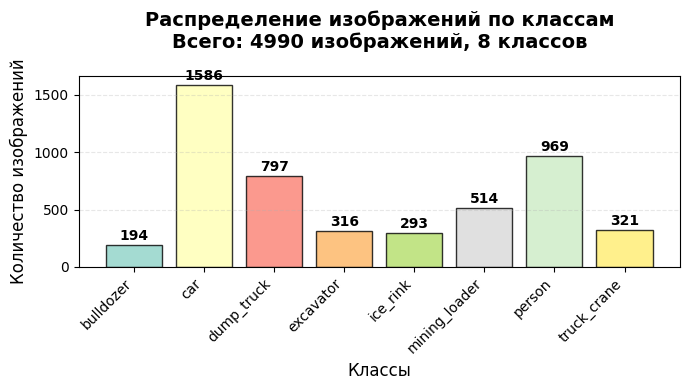

In [7]:
# Простой анализ датасета с визуализацией

import os
import matplotlib.pyplot as plt
import numpy as np

def analyze_dataset_simple(dataset_path):
    """
    Простой анализ датасета с визуализацией
    """
    # Проверяем существование пути
    if not os.path.exists(dataset_path):
        print(f"❌ Ошибка: путь '{dataset_path}' не существует")
        return None
    
    # Получаем список классов
    class_names = [d for d in os.listdir(dataset_path) 
                  if os.path.isdir(os.path.join(dataset_path, d))]
    class_names.sort()
    
    if not class_names:
        print("❌ В датасете не найдено папок с классами")
        return None
    
    # Подсчет файлов
    class_counts = {}
    total_files = 0
    
    print("📊 АНАЛИЗ ДАТАСЕТА:")
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        image_files = [f for f in os.listdir(class_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        count = len(image_files)
        class_counts[class_name] = count
        total_files += count
        print(f"  {class_name}: {count} файлов")
    
    print(f"📈 ИТОГО: {total_files} изображений, {len(class_names)} классов")
    
    # Визуализация
    plt.figure(figsize=(7, 4))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    # Создаем диаграмму
    bars = plt.bar(classes, counts, color=plt.cm.Set3(np.linspace(0, 1, len(classes))), 
                   edgecolor='black', alpha=0.8)
    
    # Настройки графика
    plt.title(f'Распределение изображений по классам\nВсего: {total_files} изображений, {len(class_names)} классов', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Классы', fontsize=12)
    plt.ylabel('Количество изображений', fontsize=12)
    
    # Поворачиваем подписи и выравниваем
    plt.xticks(rotation=45, ha='right')
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + max(counts)*0.01,
                f'{count}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    # Добавляем сетку для удобства чтения
    plt.grid(True, axis='y', alpha=0.3, linestyle='--')
    
    # Настраиваем отступы
    plt.tight_layout()
    
    plt.show()
    
    return {'class_names': class_names, 'class_counts': class_counts, 'total_files': total_files}

# ИСПОЛЬЗОВАНИЕ:
# Просто вызовите функцию с путем к вашему датасету
result = analyze_dataset_simple(IMAGE_PATH)

In [8]:
# integer labels
# САМЫЙ ПРОСТОЙ ВАРИАНТ - integer labels

import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input
import numpy as np
import matplotlib.pyplot as plt

height, width = 224, 224
batch_size=16

print("🔄 СОЗДАЕМ ПАЙПЛАЙН...")

# Загрузка данных (хорошо!)
train_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='training',
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

validation_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='validation', 
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

# Проверка формата (хорошо!)
images, labels = next(iter(train_data_raw))
print(f"Labels shape: {labels.shape}")  # (32,) - integer
print(f"Labels: {labels.numpy()[:15]}")  # [0, 1, 0, 2, 1]

class_names = train_data_raw.class_names
num_classes = len(class_names)
print(f"🏷️ Классы: {class_names}")

# Аугментация (хорошо!)
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])

# УПРОЩЕННЫЙ ПАЙПЛАЙН:
#print("🔧 СОЗДАЕМ ПРОСТОЙ ПАЙПЛАЙН...")

def preprocess_and_augment(image, label, training=False):
    """Preprocess + аугментация если training=True"""
    image = preprocess_input(tf.cast(image, tf.float32))
    if training:
        image = data_augmentation(image, training=True)
    return image, label

# Финальные datasets за 2 шага
train_data = (
    train_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=True),
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)

validation_data = (
    validation_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=False), 
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)

print("✅ Пайплайн создан!")

🔄 СОЗДАЕМ ПАЙПЛАЙН...
Found 4990 files belonging to 8 classes.
Using 3992 files for training.


I0000 00:00:1760959632.969136  246382 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9558 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070, pci bus id: 0000:01:00.0, compute capability: 8.9


Found 4990 files belonging to 8 classes.
Using 998 files for validation.
Labels shape: (16,)
Labels: [0 1 1 5 2 4 2 6 5 0 1 3 2 1 1]
🏷️ Классы: ['bulldozer', 'car', 'dump_truck', 'excavator', 'ice_rink', 'mining_loader', 'person', 'truck_crane']
✅ Пайплайн создан!


In [9]:
# Посмотреть размер одного батча
for images, labels in train_data.take(1):
    print("Форма одного батча:", images.shape)
    print("Размер одного батча в MiB:",
          tf.size(images).numpy() * 4 / (1024 ** 2), "MiB")

2025-10-20 14:27:18.512773: E tensorflow/core/util/util.cc:131] oneDNN supports DT_HALF only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


Форма одного батча: (16, 224, 224, 3)
Размер одного батча в MiB: 9.1875 MiB


2025-10-20 14:27:18.778029: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [11]:
# Проверим реальное состояние данных
images, labels = next(iter(train_data))
print("🔍 Реальные данные:")
print(f"  Диапазон изображений: {images.numpy().min():.3f} - {images.numpy().max():.3f}")
print(f"  Тип данных: {images.dtype}")
print(f"  Форма labels: {labels.shape}")
print(f"  Пример labels: {labels.numpy()[0]}")

🔍 Реальные данные:
  Диапазон изображений: -123.688 - 151.000
  Тип данных: <dtype: 'float16'>
  Форма labels: (16,)
  Пример labels: 0


2025-10-20 14:27:25.286319: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 1339300362065322795
2025-10-20 14:27:25.286412: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 12642938607319586169
2025-10-20 14:27:25.286423: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 16913031693814688085
2025-10-20 14:27:25.286427: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 13232881780855258101
2025-10-20 14:27:25.286432: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 5007832136536695350
2025-10-20 14:27:25.286441: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 1882006198776617732
2025-10-20 14:27:25.286445: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv 

🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):
📊 Распределение в тренировочных данных:


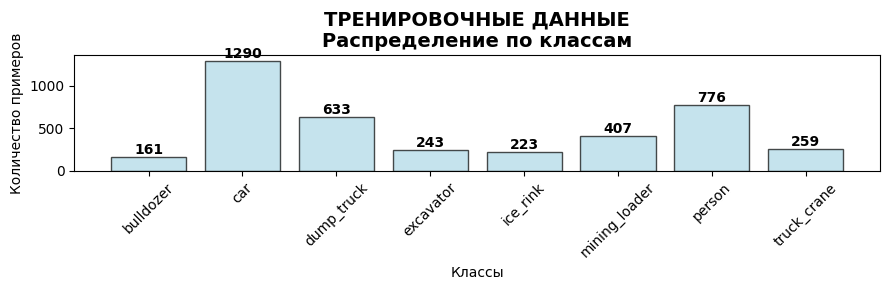

📊 Распределение в валидационных данных:


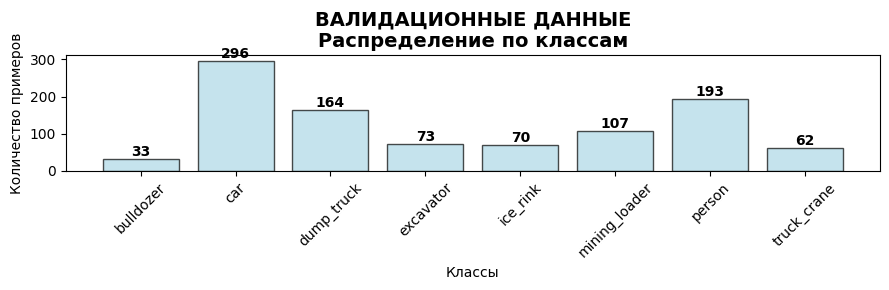


🖼️ По одному примеру на класс (тренировка):


2025-10-20 14:27:34.524374: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


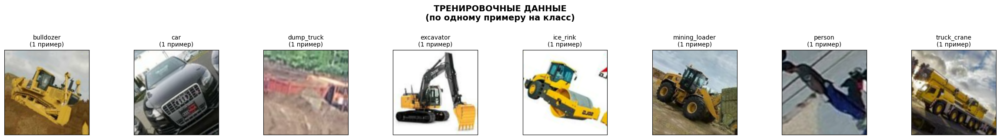


🖼️ По одному примеру на класс (валидация):


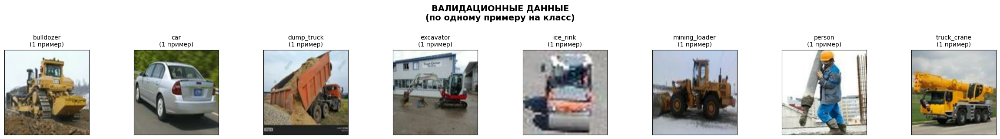

In [12]:
def visualize_single_example_per_class(dataset, class_names, title=""):
    """
    Визуализация по одному примеру для каждого класса
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset.take(10):  # Берем несколько батчей
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Создаем сетку для визуализации
    cols = len(class_names)
    fig, axes = plt.subplots(1, cols, figsize=(3*cols, 3))
    
    if cols == 1:
        axes = [axes]
    
    fig.suptitle(f'{title}\n(по одному примеру на класс)', fontsize=14, fontweight='bold', y=1.05)
    
    for class_idx, class_name in enumerate(class_names):
        ax = axes[class_idx]
        
        # Находим первый пример этого класса
        class_mask = all_labels == class_idx
        class_examples = all_images[class_mask]
        
        if len(class_examples) > 0:
            # Берем первый пример класса
            image = class_examples[0].copy()
            
            # Восстанавливаем оригинальные цвета
            image[..., 0] += 103.939  # B
            image[..., 1] += 116.779  # G
            image[..., 2] += 123.68   # R
            image = np.clip(image, 0, 255).astype('uint8')
            image = image[..., ::-1]  # BGR → RGB
            
            ax.imshow(image)
            ax.set_title(f'{class_name}\n(1 пример)', fontsize=10)
        else:
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title(f'{class_name}\n(нет примеров)', fontsize=10)
            ax.text(0.5, 0.5, 'Нет примеров', 
                   ha='center', va='center', 
                   transform=ax.transAxes, fontsize=8)
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(False)
    
    plt.tight_layout()
    plt.show()

# БЫСТРАЯ версия распределения
def visualize_class_distribution_simple(dataset, class_names, title=""):
    """
    Упрощенная визуализация распределения классов
    """
    # Считаем количество примеров по классам
    class_counts = {name: 0 for name in class_names}
    
    for images, labels in dataset:
        for label in labels.numpy():
            class_counts[class_names[label]] += 1
    
    # Визуализация
    plt.figure(figsize=(9, 3))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    bars = plt.bar(classes, counts, color='lightblue', edgecolor='black', alpha=0.7)
    plt.title(f'{title}\nРаспределение по классам', fontsize=14, fontweight='bold')
    plt.xlabel('Классы')
    plt.ylabel('Количество примеров')
    plt.xticks(rotation=45)
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    return class_counts

# Тестируем упрощенную версию
print("🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):")
print("📊 Распределение в тренировочных данных:")
train_counts = visualize_class_distribution_simple(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("📊 Распределение в валидационных данных:")
val_counts = visualize_class_distribution_simple(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (тренировка):")
visualize_single_example_per_class(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (валидация):")
visualize_single_example_per_class(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

In [13]:
# 2. Scikit-Optimize (Bayesian Optimization)

import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# 🔥 ВАЖНО: ВСЕ импорты из scikit-optimize
from skopt import gp_minimize
from skopt.space import Real, Integer, Categorical
from skopt.utils import use_named_args  # ← ДОБАВЬ ЭТОТ ИМПОРТ!
from skopt.plots import plot_convergence, plot_objective

import numpy as np
import matplotlib.pyplot as plt


# 1. ОПРЕДЕЛЯЕМ ПРОСТРАНСТВО ПОИСКА
space = [
    Integer(256, 1024, name='units_1'),           # units_1 от 128 до 1024
    Integer(64, 256, name='units_2'),            # units_2 от 64 до 512
    Real(0.4, 0.8, name='dropout_1'),            # dropout_1 от 10% до 80%
    Real(0.1, 0.5, name='dropout_2'),            # dropout_2 от 10% до 60%
    Real(1e-4, 1e-2, prior='log-uniform', name='l2_reg'),  # L2 регуляризация
    Real(1e-5, 5e-3, prior='log-uniform', name='learning_rate'),  # Learning rate
    Categorical(['relu', 'elu', 'selu'], name='activation')  # Функция активации
]

print("🎯 Пространство поиска определено:")
for param in space:
    print(f"  {param.name}: {param}")

# 2. ФУНКЦИЯ ДЛЯ СОЗДАНИЯ МОДЕЛИ
def create_skopt_model(units_1, units_2, dropout_1, dropout_2, l2_reg, learning_rate, activation):
    """Создает модель с заданными параметрами"""
    
    # Базовая модель
    base_model = ResNet50(
        weights='imagenet',
        include_top=False,
        input_shape=(224, 224, 3)
    )
    base_model.trainable = False
    
    # Строим модель
    inputs = tf.keras.Input(shape=(224, 224, 3))
    x = base_model(inputs, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(units_1, activation=activation,kernel_regularizer=l2(l2_reg))(x)
    x = Dropout(dropout_1)(x)
    x = Dense(units_2, activation=activation, kernel_regularizer=l2(l2_reg))(x)
    x = Dropout(dropout_2)(x) 
    outputs = Dense(num_classes, activation='softmax')(x)
    
    model = Model(inputs, outputs)
    
    # Компилируем
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

# 3. ЦЕЛЕВАЯ ФУНКЦИЯ ДЛЯ ОПТИМИЗАЦИИ
@use_named_args(space)
def objective(**params):
    """
    Целевая функция для оптимизации
    Возвращает отрицательную accuracy (минимизируем потерю)
    """
    print(f"\n🔍 Тестируем параметры:")
    for key, value in params.items():
        print(f"   {key}: {value}")
    
    try:
        # Создаем модель
        model = create_skopt_model(**params)
        
        # Обучаем с ранней остановкой
        history = model.fit(
            train_data,
            epochs=30,  # Можно уменьшить для скорости
            validation_data=validation_data,
            verbose=0,
            callbacks=[
                tf.keras.callbacks.EarlyStopping(
                    monitor='val_accuracy',
                    patience=5,
                    restore_best_weights=True,
                    verbose=1
                )
            ]
        )
        
        # Берем лучшую accuracy из истории
        best_val_accuracy = max(history.history['val_accuracy'])
        
        print(f"✅ Результат: val_accuracy = {best_val_accuracy:.4f}")
        
        # Возвращаем отрицательную accuracy (минимизируем потерю)
        return -best_val_accuracy
        
    except Exception as e:
        print(f"❌ Ошибка: {e}")
        # Возвращаем плохой результат при ошибке
        return 1.0

# 4. ЗАПУСК ОПТИМИЗАЦИИ
print("🚀 ЗАПУСК BAYESIAN OPTIMIZATION...")

result = gp_minimize(
    func=objective,           # Целевая функция
    dimensions=space,         # Пространство параметров
    n_calls=30,              # Количество испытаний
    n_random_starts=5,       # Случайные старты в начале
    random_state=42,         # Для воспроизводимости
    verbose=True,            # Вывод прогресса
    n_jobs=1                 # Количество параллельных jobs
)

print("\n🎯 ОПТИМИЗАЦИЯ ЗАВЕРШЕНА!")

# 5. РЕЗУЛЬТАТЫ
print(f"\n🏆 ЛУЧШИЕ ПАРАМЕТРЫ:")
best_params = {}
for i, param in enumerate(space):
    best_value = result.x[i]
    best_params[param.name] = best_value
    print(f"  {param.name}: {best_value}")

print(f"\n📊 ЛУЧШАЯ VAL_ACCURACY: {-result.fun:.4f}")

# 6. СОЗДАЕМ ФИНАЛЬНУЮ МОДЕЛЬ С ЛУЧШИМИ ПАРАМЕТРАМИ
print("\n🔧 СОЗДАЕМ ФИНАЛЬНУЮ МОДЕЛЬ...")
model = create_skopt_model(**best_params)
model.summary()



🎯 Пространство поиска определено:
  units_1: Integer(low=256, high=1024, prior='uniform', transform='identity')
  units_2: Integer(low=64, high=256, prior='uniform', transform='identity')
  dropout_1: Real(low=0.4, high=0.8, prior='uniform', transform='identity')
  dropout_2: Real(low=0.1, high=0.5, prior='uniform', transform='identity')
  l2_reg: Real(low=0.0001, high=0.01, prior='log-uniform', transform='identity')
  learning_rate: Real(low=1e-05, high=0.005, prior='log-uniform', transform='identity')
  activation: Categorical(categories=('relu', 'elu', 'selu'), prior=None)
🚀 ЗАПУСК BAYESIAN OPTIMIZATION...
Iteration No: 1 started. Evaluating function at random point.

🔍 Тестируем параметры:
   units_1: 868
   units_2: 99
   dropout_1: 0.7118764001091078
   dropout_2: 0.33874006317859484
   l2_reg: 0.0007792297153882995
   learning_rate: 1.8613553803796207e-05
   activation: elu


I0000 00:00:1760959715.923808  246671 service.cc:152] XLA service 0x787a500025e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1760959715.923855  246671 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4070, Compute Capability 8.9
2025-10-20 14:28:36.046139: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1760959716.828406  246671 cuda_dnn.cc:529] Loaded cuDNN version 90501
I0000 00:00:1760959720.611009  246671 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 17.
✅ Результат: val_accuracy = 0.9689
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 111.3554
Function value obtained: -0.9689
Current minimum: -0.9689
Iteration No: 2 started. Evaluating function at random point.

🔍 Тестируем параметры:
   units_1: 512
   units_2: 91
   dropout_1: 0.6603553891795413
   dropout_2: 0.12256463161084011
   l2_reg: 0.0027796975515266826
   learning_rate: 0.0034129160764973607
   activation: relu


2025-10-20 14:30:36.622128: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 40 bytes spill stores, 40 bytes spill loads

2025-10-20 14:30:36.754456: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 112 bytes spill stores, 112 bytes spill loads

2025-10-20 14:30:38.957054: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 36 bytes spill stores, 36 bytes spill loads

2025-10-20 14:30:39.022019: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 120 bytes spill stores, 120 bytes spill loads



Epoch 10: early stopping
Restoring model weights from the end of the best epoch: 5.
✅ Результат: val_accuracy = 0.9389
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 52.2755
Function value obtained: -0.9389
Current minimum: -0.9689
Iteration No: 3 started. Evaluating function at random point.

🔍 Тестируем параметры:
   units_1: 1018
   units_2: 183
   dropout_1: 0.6446612641953124
   dropout_2: 0.10282652208788697
   l2_reg: 0.00011120513715710631
   learning_rate: 0.000260826111672049
   activation: elu
Epoch 16: early stopping
Restoring model weights from the end of the best epoch: 11.
✅ Результат: val_accuracy = 0.9760
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 75.6358
Function value obtained: -0.9760
Current minimum: -0.9760
Iteration No: 4 started. Evaluating function at random point.

🔍 Тестируем параметры:
   units_1: 292
   units_2: 251
   dropout_1: 0.49310853617212175
   dropout_2: 0.13624257381312832
   l2_reg: 0.0017249321573178

2025-10-20 14:37:14.260339: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 92 bytes spill stores, 92 bytes spill loads

2025-10-20 14:37:14.315316: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 196 bytes spill stores, 196 bytes spill loads

2025-10-20 14:37:14.465000: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 572 bytes spill stores, 572 bytes spill loads

2025-10-20 14:37:14.481223: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 96 bytes spill stores, 96 bytes spill loads

2025-10-20 14:37:14.489269: I extern

Epoch 12: early stopping
Restoring model weights from the end of the best epoch: 7.
✅ Результат: val_accuracy = 0.9749
Iteration No: 8 ended. Search finished for the next optimal point.
Time taken: 59.8915
Function value obtained: -0.9749
Current minimum: -0.9760
Iteration No: 9 started. Searching for the next optimal point.

🔍 Тестируем параметры:
   units_1: 453
   units_2: 229
   dropout_1: 0.7697265735316656
   dropout_2: 0.45228165118031893
   l2_reg: 0.0038694462088952283
   learning_rate: 1e-05
   activation: relu


2025-10-20 14:38:13.892928: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 168 bytes spill stores, 168 bytes spill loads

2025-10-20 14:38:14.048389: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 104 bytes spill stores, 104 bytes spill loads

2025-10-20 14:38:14.153072: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 112 bytes spill stores, 112 bytes spill loads

2025-10-20 14:38:16.717076: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 64 bytes spill stores, 64 bytes spill loads

2025-10-20 14:38:16.722321: I exte

Restoring model weights from the end of the best epoch: 30.
✅ Результат: val_accuracy = 0.9248
Iteration No: 9 ended. Search finished for the next optimal point.
Time taken: 133.9357
Function value obtained: -0.9248
Current minimum: -0.9760
Iteration No: 10 started. Searching for the next optimal point.

🔍 Тестируем параметры:
   units_1: 993
   units_2: 241
   dropout_1: 0.6091182420154821
   dropout_2: 0.1349369384370012
   l2_reg: 0.00013030873350936833
   learning_rate: 0.0005089473951842926
   activation: relu


2025-10-20 14:40:29.381488: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 104 bytes spill stores, 104 bytes spill loads

2025-10-20 14:40:29.389875: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 360 bytes spill stores, 360 bytes spill loads

2025-10-20 14:40:29.592430: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 640 bytes spill stores, 644 bytes spill loads

2025-10-20 14:40:29.675625: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1948', 436 bytes spill stores, 436 bytes spill loads

2025-10-20 14:40:29.700866: I ex

Epoch 13: early stopping
Restoring model weights from the end of the best epoch: 8.
✅ Результат: val_accuracy = 0.9709
Iteration No: 10 ended. Search finished for the next optimal point.
Time taken: 64.9024
Function value obtained: -0.9709
Current minimum: -0.9760
Iteration No: 11 started. Searching for the next optimal point.

🔍 Тестируем параметры:
   units_1: 256
   units_2: 64
   dropout_1: 0.8
   dropout_2: 0.5
   l2_reg: 0.01
   learning_rate: 1e-05
   activation: selu
Restoring model weights from the end of the best epoch: 30.
✅ Результат: val_accuracy = 0.9339
Iteration No: 11 ended. Search finished for the next optimal point.
Time taken: 133.5081
Function value obtained: -0.9339
Current minimum: -0.9760
Iteration No: 12 started. Searching for the next optimal point.

🔍 Тестируем параметры:
   units_1: 1024
   units_2: 222
   dropout_1: 0.4740774611610962
   dropout_2: 0.1
   l2_reg: 0.0001
   learning_rate: 0.0001818312052823524
   activation: elu
Epoch 10: early stopping
Rest

Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_62 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_30     │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_60 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 256)            │       262,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_61 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,950,344 (98.99 MB)

 Trainable params: 2,362,632 (9.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.3697 - loss: 20.4941
Epoch 1: val_accuracy improved from None to 0.87475, saving model to best_model-scopt.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - accuracy: 0.5438 - loss: 19.4269 - val_accuracy: 0.8747 - val_loss: 17.7407 - learning_rate: 2.8134e-05
Epoch 2/30
195/250 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7689 - loss: 18.1290
Epoch 2: val_accuracy improved from 0.87475 to 0.92585, saving model to best_model-scopt.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.7881 - loss: 17.9017 - val_accuracy: 0.9259 - val_loss: 17.1508 - learning_rate: 2.8134e-05
Epoch 3/30
246/250 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.8502 - loss: 17.3160
Epoch 3: val_accuracy improved from 0.92585 to 0.94489, saving model to best_model-scopt.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - accuracy: 0.8560 - loss: 17.1813 - val_accuracy: 0.9449 - val_loss: 16.5916 - learning_rate: 2.8134e-05
Epoch 4/3

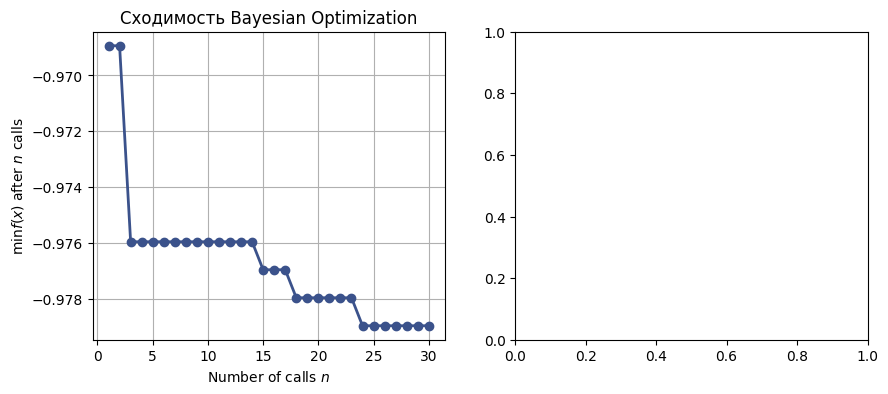

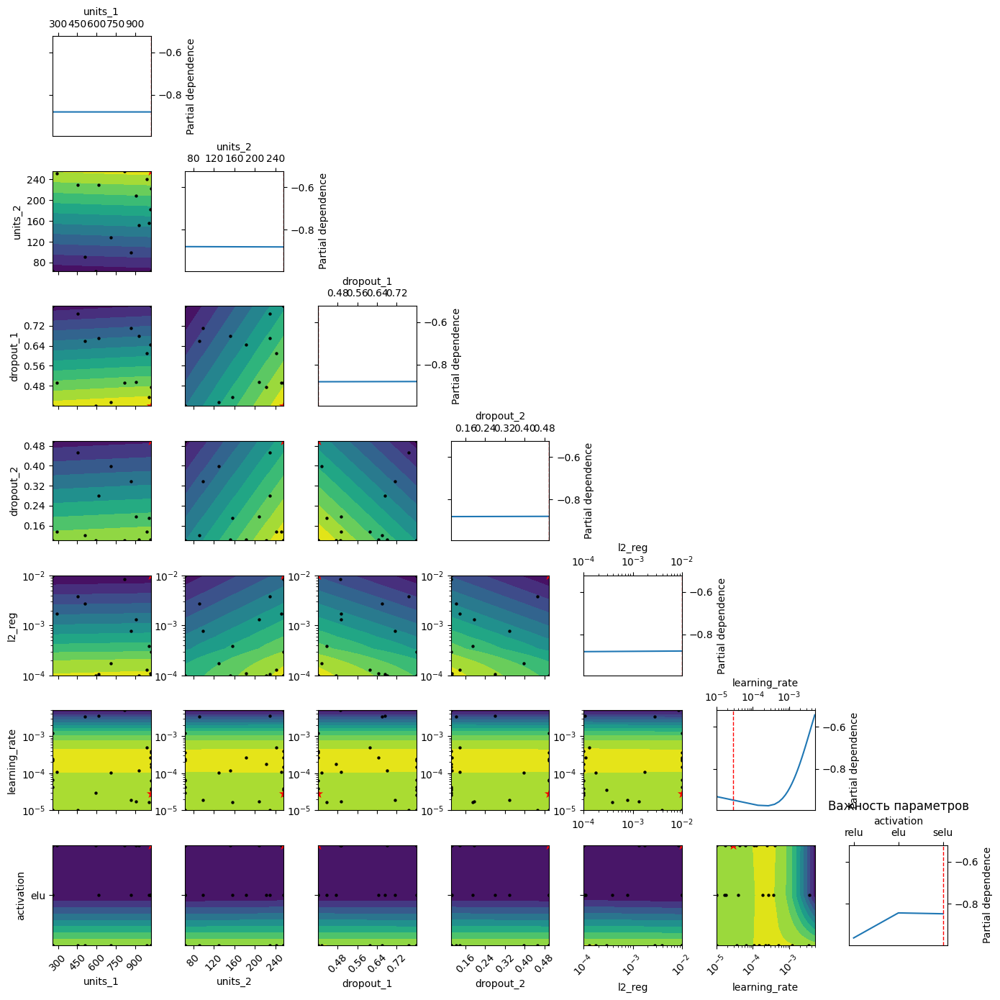

💾 Результаты сохранены!
🎉 SCIKIT-OPTIMIZE ЗАВЕРШЕНА!

🎯 Для просмотра TensorBoard выполните:
!tensorboard --logdir logs/fit
И откройте http://localhost:6006/


In [14]:
# Обучаем финальную модель дольше
import datetime
import os
from tensorflow.keras.callbacks import TensorBoard

# 1. Создаем папку для логов
log_dir = os.path.join("logs", "fit", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
os.makedirs(log_dir, exist_ok=True)

# 2. Создаем callback
tensorboard_callback = TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=False,  # Можно отключить для экономии места
    update_freq='epoch',
    profile_batch=0
)


final_history = model.fit(
    train_data,
    epochs=30,
    validation_data=validation_data,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1),
        tf.keras.callbacks.ModelCheckpoint('best_model-scopt.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
        tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1),
        tensorboard_callback
    ],
    verbose=1
)

# 7. ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ
print("\n📈 ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ...")

# График сходимости
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plot_convergence(result)
plt.title('Сходимость Bayesian Optimization')

# Важность параметров
plt.subplot(1, 2, 2)
plot_objective(result)
plt.title('Важность параметров')
plt.tight_layout()
plt.show()

# 8. СОХРАНЕНИЕ РЕЗУЛЬТАТОВ
model.save('best_skopt_model-skopt.keras')

# # Сохраняем параметры
# import json
# results_summary = {
#     'best_params': best_params,
#     'best_accuracy': -result.fun,
#     'all_results': [
#         {'params': dict(zip([p.name for p in space], x)), 'accuracy': -fun}
#         for x, fun in zip(result.x_iters, result.func_vals)
#     ]
# }

# with open('skopt_optimization_results.json', 'w') as f:
#     json.dump(results_summary, f, indent=2)

print("💾 Результаты сохранены!")
print("🎉 SCIKIT-OPTIMIZE ЗАВЕРШЕНА!")

# 5. После обучения запускаем TensorBoard
print("\n🎯 Для просмотра TensorBoard выполните:")
print("!tensorboard --logdir logs/fit")
print("И откройте http://localhost:6006/")



In [ ]:
!tensorboard --logdir logs/fit

/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/tensorboard/default.py:30: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


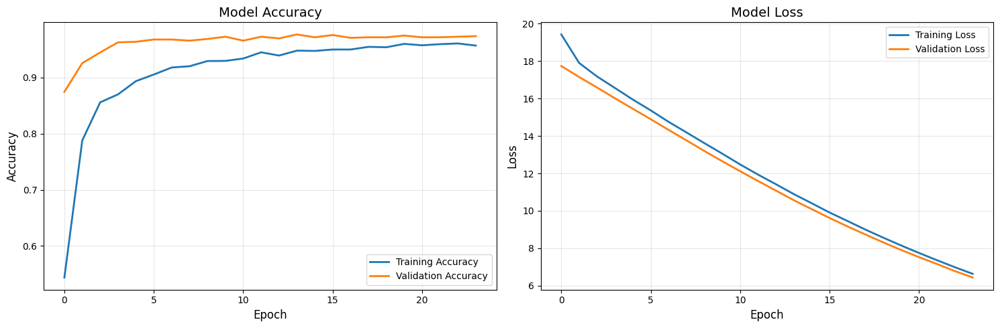

In [15]:
# Визуализация результатов

import matplotlib.pyplot as plt
import numpy as np

history = final_history

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)

🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...
📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...
🔄 Получаем предсказания...
🔄 Собираем предсказания и метки...


2025-10-20 15:19:02.157527: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1917', 256 bytes spill stores, 256 bytes spill loads

2025-10-20 15:19:02.338828: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1902', 240 bytes spill stores, 240 bytes spill loads



📦 Обработано батчей: 10
📦 Обработано батчей: 20
📦 Обработано батчей: 30
📦 Обработано батчей: 40
📦 Обработано батчей: 50
📦 Обработано батчей: 60


2025-10-20 15:19:07.874607: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1902', 252 bytes spill stores, 252 bytes spill loads

2025-10-20 15:19:08.162927: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1902', 348 bytes spill stores, 428 bytes spill loads

2025-10-20 15:19:08.244082: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1917', 240 bytes spill stores, 240 bytes spill loads



✅ Собрано 998 предсказаний
🔢 Уникальные истинные классы: [0 1 2 3 4 5 6 7]
🔢 Уникальные предсказанные классы: [0 1 2 3 4 5 6 7]
📋 Присутствующие классы: ['bulldozer', 'car', 'dump_truck', 'excavator', 'ice_rink', 'mining_loader', 'person', 'truck_crane']
📏 Confusion matrix shape: (8, 8)


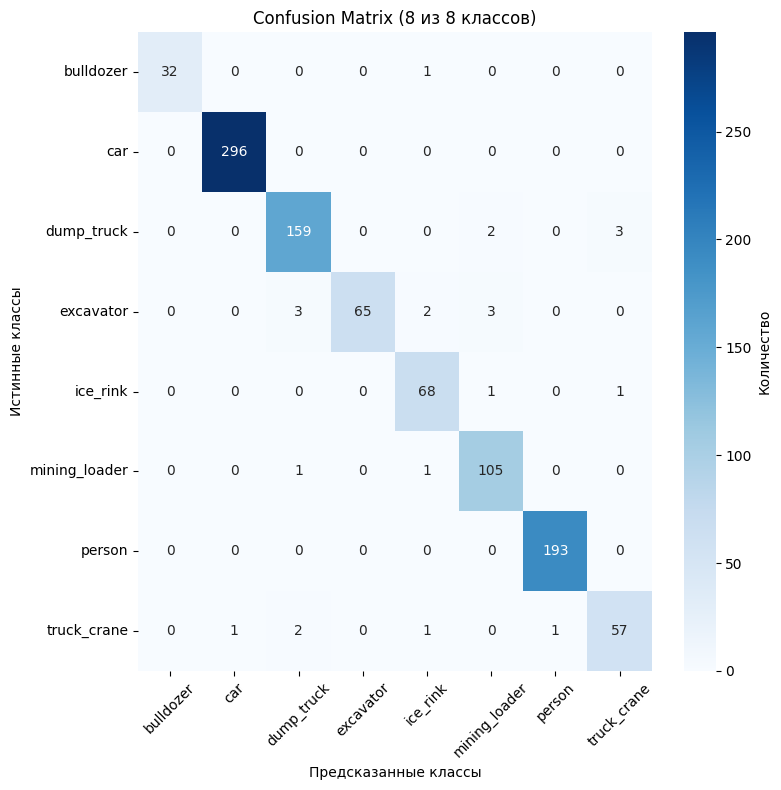


📈 ДЕТАЛЬНАЯ СТАТИСТИКА:
Всего примеров: 998
Общая точность: 0.9770

🎯 ТОЧНОСТЬ ПО КЛАССАМ:
  bulldozer: 0.9697 (32/33)
  car: 1.0000 (296/296)
  dump_truck: 0.9695 (159/164)
  excavator: 0.8904 (65/73)
  ice_rink: 0.9714 (68/70)
  mining_loader: 0.9813 (105/107)
  person: 1.0000 (193/193)
  truck_crane: 0.9194 (57/62)

📊 CLASSIFICATION REPORT:
               precision    recall  f1-score   support

    bulldozer     1.0000    0.9697    0.9846        33
          car     0.9966    1.0000    0.9983       296
   dump_truck     0.9636    0.9695    0.9666       164
    excavator     1.0000    0.8904    0.9420        73
     ice_rink     0.9315    0.9714    0.9510        70
mining_loader     0.9459    0.9813    0.9633       107
       person     0.9948    1.0000    0.9974       193
  truck_crane     0.9344    0.9194    0.9268        62

     accuracy                         0.9770       998
    macro avg     0.9709    0.9627    0.9663       998
 weighted avg     0.9774    0.9770    0.9768  

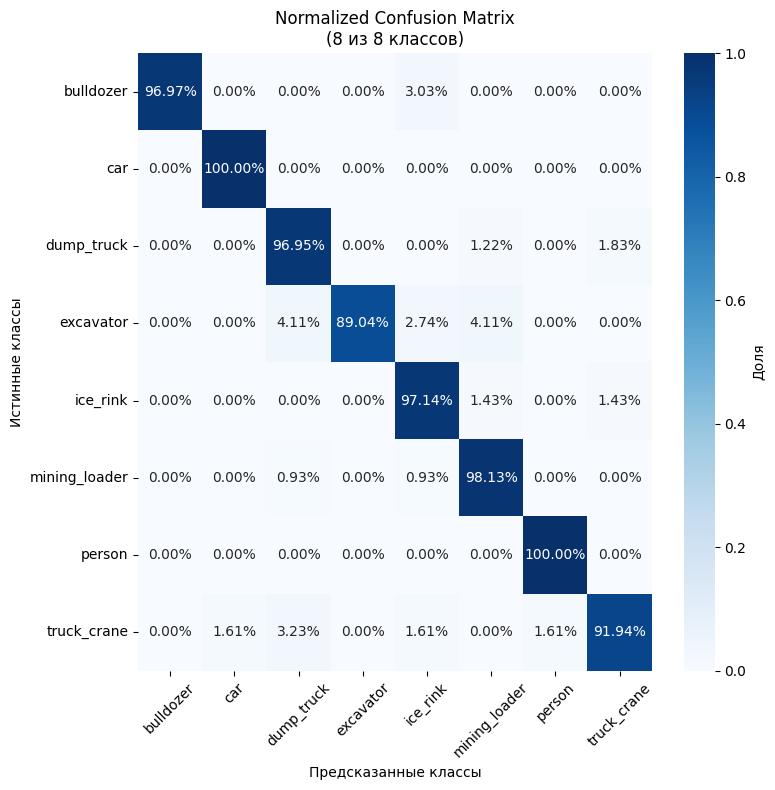

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf

history = final_history

'''
Синие тона:
cmap='Blues' # твой текущий
cmap='viridis' 
cmap='coolwarm'
cmap='icefire'

Зеленые тона:
cmap='Greens'
cmap='viridis'
cmap='summer'

Красные/оранжевые:
cmap='Reds'
cmap='Oranges'
cmap='YlOrBr'  
cmap='hot'

Фиолетовые:
cmap='Purples'
cmap='magma'
cmap='plasma'
'''


def get_all_predictions_modern(model, dataset):
    """Получает все предсказания и метки из датасета"""
    print("🔄 Собираем предсказания и метки...")
    
    all_preds = []
    all_true_labels = []
    
    # Проходим по всем батчам датасета
    for batch_idx, (images, labels) in enumerate(dataset):
        # Получаем предсказания для текущего батча
        batch_preds = model.predict(images, verbose=0)
        all_preds.append(batch_preds)
        all_true_labels.append(labels.numpy())
        
        # Прогресс каждые 10 батчей
        if (batch_idx + 1) % 10 == 0:
            print(f"📦 Обработано батчей: {batch_idx + 1}")
    
    # Объединяем все батчи
    all_preds = np.concatenate(all_preds, axis=0)
    all_true_labels = np.concatenate(all_true_labels, axis=0)
    
    print(f"✅ Собрано {len(all_preds)} предсказаний")
    return all_preds, all_true_labels

def safe_confusion_matrix_analysis(model, dataset, class_names):
    """Безопасный анализ confusion matrix с автоматической обработкой отсутствующих классов"""
    print("📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...")
    
    # Получаем предсказания
    print("🔄 Получаем предсказания...")
    preds, true_labels = get_all_predictions_modern(model, dataset)
    
    # Для sparse categorical - метки уже целые числа, не нужно argmax
    if len(true_labels.shape) == 1:  # sparse labels [0, 1, 2, ...]
        true_classes = true_labels
    else:  # one-hot encoded labels
        true_classes = np.argmax(true_labels, axis=1)
    
    preds_classes = np.argmax(preds, axis=1)
    
    # Находим какие классы реально присутствуют в данных
    present_true_classes = np.unique(true_classes)
    present_pred_classes = np.unique(preds_classes)
    
    print(f"🔢 Уникальные истинные классы: {present_true_classes}")
    print(f"🔢 Уникальные предсказанные классы: {present_pred_classes}")
    
    # Определяем какие классы из class_names реально присутствуют
    present_class_indices = sorted(present_true_classes)
    present_class_names = [class_names[i] for i in present_class_indices]
    
    print(f"📋 Присутствующие классы: {present_class_names}")
    
    absent_classes = [class_names[i] for i in range(len(class_names)) if i not in present_true_classes]
    if absent_classes:
        print(f"❌ Отсутствующие классы: {absent_classes}")
    
    # Создаем confusion matrix только для присутствующих классов
    cm = confusion_matrix(true_classes, preds_classes, labels=present_class_indices)
    
    print(f"📏 Confusion matrix shape: {cm.shape}")
    
    # Визуализируем
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Количество'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Confusion Matrix ({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # Статистика
    total_samples = len(true_classes)
    accuracy = np.sum(preds_classes == true_classes) / total_samples
    
    print(f"\n📈 ДЕТАЛЬНАЯ СТАТИСТИКА:")
    print(f"Всего примеров: {total_samples}")
    print(f"Общая точность: {accuracy:.4f}")
    
    print(f"\n🎯 ТОЧНОСТЬ ПО КЛАССАМ:")
    for i, class_idx in enumerate(present_class_indices):
        class_name = class_names[class_idx]
        correct = cm[i, i]
        total = np.sum(cm[i, :])
        accuracy = correct / total if total > 0 else 0
        print(f"  {class_name}: {accuracy:.4f} ({correct}/{total})")
    
    # Для отсутствующих классов
    if absent_classes:
        print(f"\n❌ ОТСУТСТВУЮЩИЕ КЛАССЫ В ВАЛИДАЦИИ:")
        for class_name in absent_classes:
            print(f"  {class_name}: 0 примеров")
    
    # Classification report только для присутствующих классов
    print(f"\n📊 CLASSIFICATION REPORT:")
    print(classification_report(true_classes, preds_classes, 
                              labels=present_class_indices,
                              target_names=present_class_names, 
                              digits=4))
    
    # Нормализованная confusion matrix
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)  # Заменяем NaN на 0
    
    sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Blues',
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Доля'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Normalized Confusion Matrix\n({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    return cm, present_class_names

# 🎯 ЗАПУСКАЕМ АНАЛИЗ
print("🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...")
cm, present_classes = safe_confusion_matrix_analysis(model, validation_data, class_names)

🎲 Тестирование случайных примеров...


2025-10-20 15:20:19.794045: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1902', 348 bytes spill stores, 428 bytes spill loads

2025-10-20 15:20:19.878712: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1902', 252 bytes spill stores, 252 bytes spill loads

2025-10-20 15:20:20.166557: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1917', 240 bytes spill stores, 240 bytes spill loads



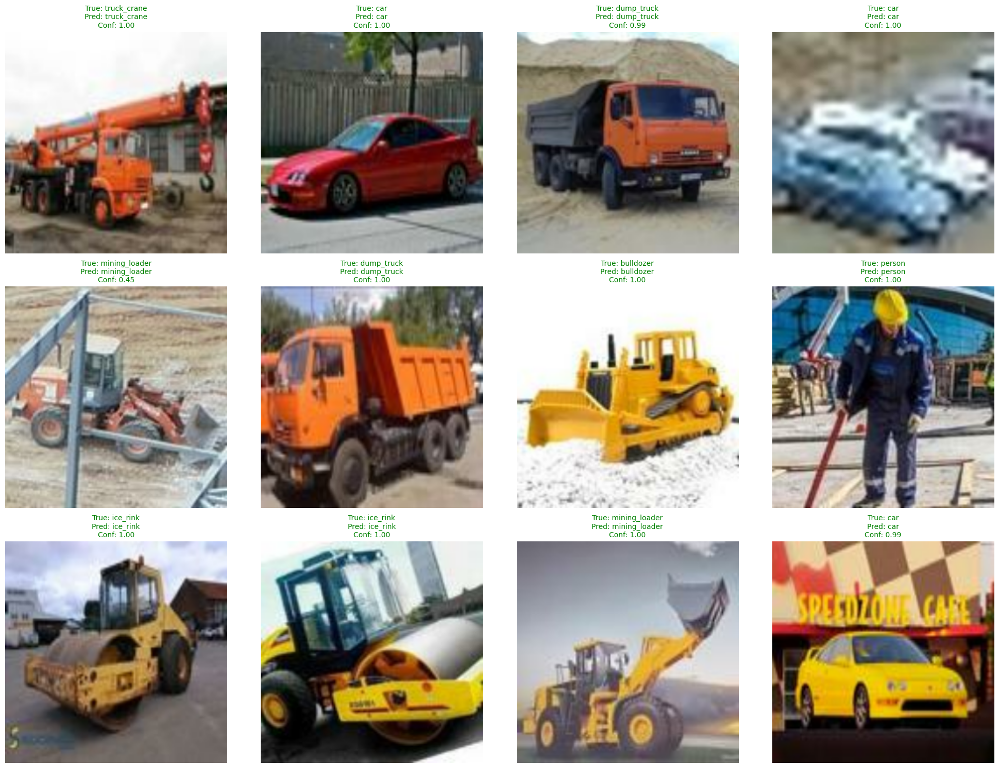

📊 Точность на 12 случайных примерах: 12/12 (100.0%)


In [17]:
# рандом ВЕРСИЯ ДЛЯ SPARSE LABELS 

def test_random_predictions_modern(model, dataset, class_names, num_samples=12):
    """
    Тестирование случайных примеров из всего датасета
    ВЕРСИЯ ДЛЯ SPARSE LABELS (целочисленные метки)
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    # Объединяем все батчи
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # ДЛЯ SPARSE LABELS - просто используем как есть, без argmax!
    true_classes = selected_labels  # ← ИСПРАВЛЕНИЕ ЗДЕСЬ
    
    # Создаем сетку
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif rows > 1 and cols == 1:
        axes = axes.reshape(-1, 1)
    
    correct = 0
    for i, idx in enumerate(indices):
        if rows == 1:
            ax = axes[col] if cols > 1 else axes
        else:
            row_idx = i // cols
            col_idx = i % cols
            ax = axes[row_idx, col_idx]
        
        # Денормализация для ResNet50
        image = selected_images[i].copy()
        image[..., 0] += 103.939
        image[..., 1] += 116.779  
        image[..., 2] += 123.68
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        if rows == 1:
            if cols > 1:
                axes[i].axis('off')
        else:
            row_idx = i // cols
            col_idx = i % cols
            axes[row_idx, col_idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    
    return correct, accuracy

# Использование случайных примеров:
print("🎲 Тестирование случайных примеров...")
correct, accuracy = test_random_predictions_modern(model, validation_data, class_names, num_samples=12)

🎲 Тестирование случайных примеров (универсальная версия)...


2025-10-20 15:20:29.276551: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1902_0', 4 bytes spill stores, 4 bytes spill loads

2025-10-20 15:20:29.479546: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1902', 348 bytes spill stores, 428 bytes spill loads

2025-10-20 15:20:29.639502: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1902', 252 bytes spill stores, 252 bytes spill loads

2025-10-20 15:20:29.685300: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1917', 240 bytes spill stores, 240 bytes spill loads

2025-10-20 15:20:29.918205: I exte

🔍 Обнаружен формат меток: SPARSE


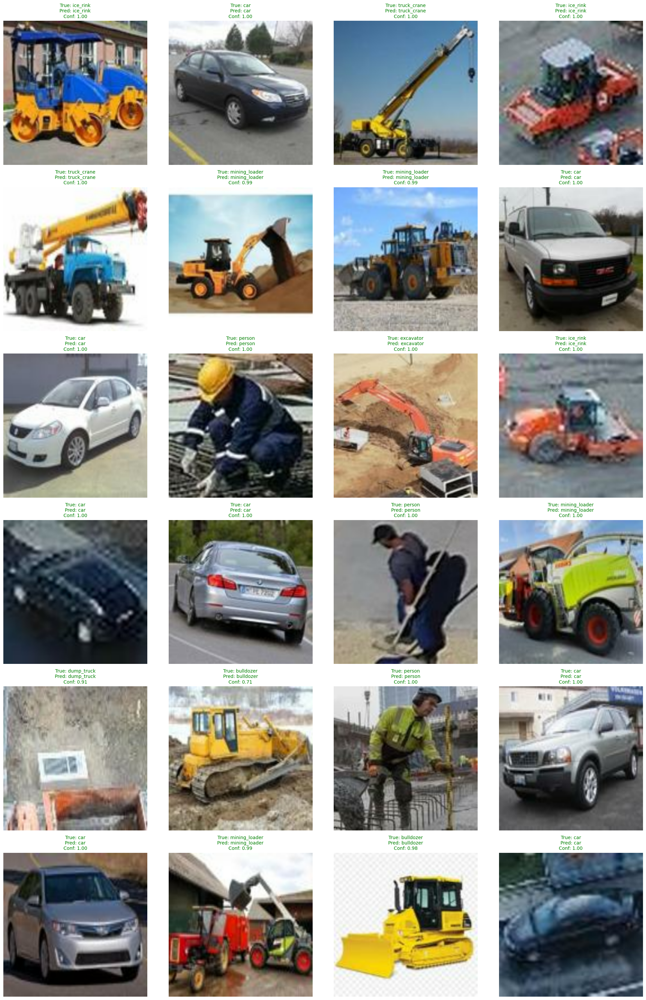

📊 Точность на 24 случайных примерах: 24/24 (100.0%)
🎯 Формат меток: SPARSE


In [18]:
# рандом УНИВЕРСАЛЬНАЯ ВЕРСИЯ (работает с любым форматом)

def test_random_predictions_universal(model, dataset, class_names, num_samples=12):
    """
    Универсальная версия для любого формата меток
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # АВТОМАТИЧЕСКОЕ ОПРЕДЕЛЕНИЕ ФОРМАТА МЕТОК
    if len(selected_labels.shape) == 1:  # SPARSE labels
        true_classes = selected_labels
        label_format = "SPARSE"
    else:  # ONE-HOT labels
        true_classes = np.argmax(selected_labels, axis=1)
        label_format = "ONE-HOT"
    
    print(f"🔍 Обнаружен формат меток: {label_format}")
    
    # Создаем сетку
    cols = 4
    rows = (len(indices) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    correct = 0
    for i, idx in enumerate(indices):
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]
        
        # Умная денормализация
        image = selected_images[i].copy()
        
        # Автоматическое определение диапазона
        if image.min() >= -1 and image.max() <= 1:
            image = (image + 1) * 127.5
        elif image.min() >= 0 and image.max() <= 1:
            image = image * 255
        else:
            # ImageNet нормализация
            image[..., 0] += 103.939
            image[..., 1] += 116.779  
            image[..., 2] += 123.68
        
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        row = i // cols
        col = i % cols
        if rows > 1:
            axes[row, col].axis('off')
        else:
            axes[col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    print(f"🎯 Формат меток: {label_format}")
    
    return correct, accuracy

# Тестируем универсальную версию
print("🎲 Тестирование случайных примеров (универсальная версия)...")
correct, accuracy = test_random_predictions_universal(model, validation_data, class_names, num_samples=24)

In [ ]:
# Сохраните модель

# Сохраняем обученную модель
model.save('cats_dogs_classifier.h5')
print("💾 Модель сохранена как 'cats_dogs_classifier.h5'")

# Или сохраняем только веса
model.save_weights('cats_dogs_weights.h5')
print("💾 Веса сохранены как 'cats_dogs_weights.h5'")

In [32]:
# Сохраняем в современном формате
model.save('best_model_scotp-2.keras')
print("💾 Модель сохранена как 'best_model_1.keras'")

💾 Модель сохранена как 'best_model_1.keras'
